In [1]:
import os
import pandas as pd
import numpy as np
import kagglehub
import shutil
from sklearn.model_selection import train_test_split
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch import Tensor
from accelerate import Accelerator
from torchinfo import summary
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from PIL import Image
from collections import defaultdict
from IPython.display import clear_output
from tqdm.auto import tqdm
from time import time
from typing import Tuple
import sys
import albumentations as A
from albumentations.pytorch import ToTensorV2

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
# Download latest version
ebhi_path = kagglehub.dataset_download("mahdiislam/colorectal-cancer-wsi")

print("Path to dataset files:", ebhi_path)

100%|██████████| 264M/264M [00:15<00:00, 17.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mahdiislam/colorectal-cancer-wsi/versions/1


In [3]:
shutil.copytree(ebhi_path, "/content/EBHI")

'/content/EBHI'

In [4]:
# Directory containing the dataset
directory = '/content/EBHI/EBHI-SEG'

# Output directories
output_train_images = '/content/EBHI/train/images'
output_train_masks = '/content/EBHI/train/masks'
output_val_images = '/content/EBHI/val/images'
output_val_masks = '/content/EBHI/val/masks'

# Create directories if they don't exist
os.makedirs(output_train_images, exist_ok=True)
os.makedirs(output_train_masks, exist_ok=True)
os.makedirs(output_val_images, exist_ok=True)
os.makedirs(output_val_masks, exist_ok=True)

# Create a DataFrame to store file paths
df = pd.DataFrame(columns=['image_files', 'mask_files'])
cancer_types = ['Adenocarcinoma', 'High-grade IN', 'Low-grade IN', 'Normal', 'Polyp', 'Serrated adenoma']

for cancer_type in cancer_types:
    image_dir = os.path.join(directory, cancer_type, 'image')
    mask_dir = os.path.join(directory, cancer_type, 'label')

    if not os.path.exists(image_dir) or not os.path.exists(mask_dir):
        print(f"Directory not found for {cancer_type}. Skipping...")
        continue

    image_files = sorted(os.listdir(image_dir))

    for file in image_files:
        image_file = os.path.join(image_dir, file)
        mask_file = os.path.join(mask_dir, file.replace('.jpg', '_mask.jpg'))

        if os.path.isfile(mask_file):
            df = pd.concat([df, pd.DataFrame({'image_files': [image_file], 'mask_files': [mask_file]})], ignore_index=True)

# Split the dataset into training and validation sets
train_df, val_df = train_test_split(df, test_size=0.3, random_state=42)

# Function to copy files to their respective directories
def copy_files(df, image_dest, mask_dest):
    for _, row in df.iterrows():
        shutil.copy(row['image_files'], os.path.join(image_dest, os.path.basename(row['image_files'])))
        shutil.copy(row['mask_files'], os.path.join(mask_dest, os.path.basename(row['mask_files'])))

# Copy training and validation files
copy_files(train_df, output_train_images, output_train_masks)
copy_files(val_df, output_val_images, output_val_masks)

# Function to count files in a directory
def count_files(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

# Print the number of files in each folder
print(f"Train Images: {count_files(output_train_images)}")
print(f"Train Masks: {count_files(output_train_masks)}")
print(f"Validation Images: {count_files(output_val_images)}")
print(f"Validation Masks: {count_files(output_val_masks)}")



Train Images: 1535
Train Masks: 1535
Validation Images: 663
Validation Masks: 663


In [5]:
class EbhiDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx])

        image = np.array(Image.open(img_path).convert("RGB"), dtype=np.float32) / 255.0
        mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32) / 255.0

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image, mask = augmented["image"], augmented["mask"]

        return image, mask

In [6]:
class CONFIG:

    USE_MIXED_PRECISION = "fp16"
    DOWNSCALE = 2
    MEAN = [0.485, 0.456, 0.406]
    STD = [0.229, 0.224, 0.225]
    EXTRA_LOSS_EPS = 1e-6
    BATCH_SIZE = 8
    SINGLE_NETWORK_TRAINING_EPOCHS = 20
    CE_VS_DICE_EVAL_EPOCHS = 15
    DELTA_BETA = 0.2

cfg = CONFIG()

In [7]:
preprocess = A.Compose([
    A.Normalize(mean=cfg.MEAN, std=cfg.STD, max_pixel_value=1.0),
    ToTensorV2(),
])


ebhi_train_ds = EbhiDataset(output_train_images, output_train_masks, transform=preprocess)
ebhi_val_ds = EbhiDataset(output_val_images, output_val_masks, transform=preprocess)
ebhi_train_dataloader = DataLoader(ebhi_train_ds, batch_size=cfg.BATCH_SIZE, shuffle=True)
ebhi_val_dataloader = DataLoader(ebhi_val_ds, batch_size=cfg.BATCH_SIZE, shuffle=True)


In [8]:
if cfg.USE_MIXED_PRECISION is not None:
    accelerator = Accelerator(mixed_precision=cfg.USE_MIXED_PRECISION)
else:
    accelerator = Accelerator()

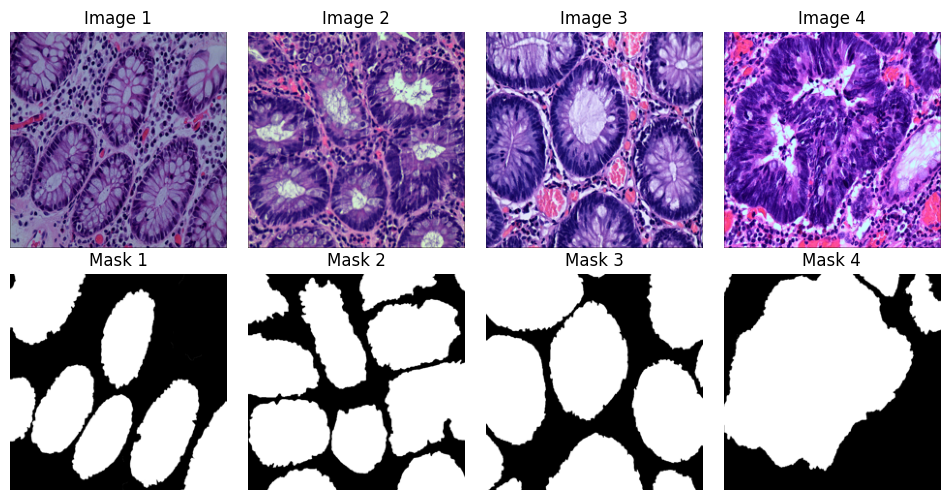

In [9]:
import matplotlib.pyplot as plt
import cv2
import random
import os

def display_samples(image_dir, mask_dir):
    image_files = os.listdir(image_dir)

    # Select 4 random images
    random_images = random.sample(image_files, 4)

    # Create subplots
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))  # Reduce height to avoid excessive spacing

    for i, image_name in enumerate(random_images):
        image_path = os.path.join(image_dir, image_name)
        mask_path = os.path.join(mask_dir, image_name)  # Assuming mask names match image names

        # Read images
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Read mask in grayscale

        # Display image
        axes[0, i].imshow(image)
        axes[0, i].set_title(f"Image {i+1}")
        axes[0, i].axis("off")

        # Display mask
        axes[1, i].imshow(mask, cmap="gray")
        axes[1, i].set_title(f"Mask {i+1}")
        axes[1, i].axis("off")

    # Adjust spacing to minimize blank space
    plt.subplots_adjust(wspace=0.1, hspace=0.1)

    plt.show()

# Call function to display samples
display_samples(output_train_images, output_train_masks)


In [10]:
def decode_image(img: torch.Tensor) -> torch.Tensor:

    if img.shape[-1] == 3 and img.dim() == 3:
        img = img.permute(2, 0, 1)

    std = torch.tensor(cfg.STD, dtype=img.dtype, device=img.device).view(3, 1, 1)
    mean = torch.tensor(cfg.MEAN, dtype=img.dtype, device=img.device).view(3, 1, 1)

    img = img * std + mean

    if img.shape[0] == 3 and img.dim() == 3:
        img = img.permute(1, 2, 0)

    return torch.clamp(img, 0, 1)


In [11]:
category_cmap = 'grey'
eval_batch_data = next(iter(ebhi_val_dataloader))

In [12]:
def dice_coeff(inp: Tensor, tgt: Tensor, eps=1e-6):
    inter = 2 * (inp * tgt).sum()
    union = inp.sum() + tgt.sum()
    dice = (inter + eps) / (union + eps)
    return dice

def dice_loss(inp: Tensor, tgt: Tensor):
    return 1 - dice_coeff(inp, tgt)

def IoU_coeff(inp: Tensor, tgt: Tensor, eps=1e-6):
    inter = (inp * tgt).sum()
    union = inp.sum() + tgt.sum() - inter
    return (inter + eps) / (union + eps)

def IoU_loss(inp: Tensor, tgt: Tensor):
    return 1 - IoU_coeff(inp, tgt)


In [13]:
def evaluate_model(model, val_dataloader, epoch, epochs, criterion, with_dice=True, with_iou=True):
    val_loss = 0
    val_dice = 0
    val_iou = 0
    examples_so_far = 0

    model.eval()
    with tqdm(val_dataloader, desc=f"Epoch {epoch}/{epochs} - Validation Loss: 0") as pbar:
        for batch in val_dataloader:
            images, true_masks = batch[0].to(device), batch[1].to(device).float()
            true_masks = true_masks.unsqueeze(1)

            with torch.no_grad():
                masks_pred = model(images)
                masks_pred = torch.sigmoid(masks_pred)

            loss = criterion(masks_pred, true_masks)
            val_loss += loss.item()
            examples_so_far += 1

            dice = dice_loss(masks_pred, true_masks)
            if with_dice:
                loss += dice
            val_dice += (1. - dice.item())

            iou = IoU_loss(masks_pred, true_masks)
            if with_iou:
                loss += iou
            val_iou += (1. - iou.item())

            pbar.update(1)
            pbar.set_description(f"Epoch {epoch}/{epochs} - Validation Loss: {val_loss / examples_so_far:.3f}, IoU: {val_iou / examples_so_far:.3f}, Dice: {val_dice / examples_so_far:.3f}")

    return {
        "validation_loss": val_loss / examples_so_far,
        "validation_DICE_score": val_dice / examples_so_far,
        "validation_IoU_score": val_iou / examples_so_far,
    }

def train_model(model, device, train_dataloader, val_dataloader, epochs=10, lr=1e-4, with_dice=True, with_iou=True):
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1e-4)
    criterion = nn.BCEWithLogitsLoss()

    model, optimizer, train_dataloader = accelerator.prepare(model, optimizer, train_dataloader)

    results = []

    for epoch in range(1, epochs + 1):
        train_loss = 0
        train_dice = 0
        train_iou = 0
        examples_so_far = 0

        model.train()
        with tqdm(train_dataloader, desc=f"Epoch {epoch}/{epochs} - Training Loss: 0") as pbar:
            for batch in train_dataloader:
                optimizer.zero_grad()
                images, true_masks = batch[0].to(device), batch[1].to(device).float()

                true_masks = true_masks.unsqueeze(1)

                masks_pred = model(images)
                masks_pred = torch.sigmoid(masks_pred)

                loss = criterion(masks_pred, true_masks)

                if with_dice:
                    dice = dice_loss(masks_pred, true_masks)
                    loss += dice
                    train_dice += (1. - dice.item())

                if with_iou:
                    iou = IoU_loss(masks_pred, true_masks)
                    loss += iou
                    train_iou += (1. - iou.item())

                accelerator.backward(loss)
                optimizer.step()

                train_loss += loss.item()
                examples_so_far += 1

                pbar.update(1)
                pbar.set_description(f"Epoch {epoch}/{epochs} - Training Loss: {train_loss / examples_so_far:.3f}")

        epoch_result = {
            "training_loss": train_loss / examples_so_far,
            "training_DICE_score": train_dice / examples_so_far if with_dice else None,
            "training_IoU_score": train_iou / examples_so_far if with_iou else None,
        }

        val_result = evaluate_model(model, val_dataloader, epoch, epochs, criterion, with_dice, with_iou)
        epoch_result.update(val_result)
        results.append(epoch_result)

    return results


In [14]:
def plot_training_progress(results, save_path=None):

    epochs = range(1, len(results) + 1)
    train_loss = [res["training_loss"] for res in results]
    val_loss = [res["validation_loss"] for res in results]

    train_dice = [res.get("training_DICE_score", None) for res in results]
    val_dice = [res["validation_DICE_score"] for res in results]

    train_iou = [res.get("training_IoU_score", None) for res in results]
    val_iou = [res["validation_IoU_score"] for res in results]

    plt.figure(figsize=(20, 6))
    plt.subplot(1, 3, 1)
    plt.plot(epochs, train_loss, label="Train Loss", marker="o", linestyle="-", color="red")
    plt.plot(epochs, val_loss, label="Validation Loss", marker="o", linestyle="--", color="blue")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training vs Validation Loss")
    plt.legend()
    plt.grid(True)
    plt.subplot(1, 3, 2)
    plt.plot(epochs, train_dice, label="Train Dice", marker="o", linestyle="-", color="green")
    plt.plot(epochs, val_dice, label="Validation Dice", marker="o", linestyle="--", color="purple")
    plt.xlabel("Epochs")
    plt.ylabel("Dice Score")
    plt.title("Training vs Validation Dice Score")
    plt.legend()
    plt.grid(True)
    plt.subplot(1, 3, 3)
    plt.plot(epochs, train_iou, label="Train IoU", marker="o", linestyle="-", color="orange")
    plt.plot(epochs, val_iou, label="Validation IoU", marker="o", linestyle="--", color="cyan")
    plt.xlabel("Epochs")
    plt.ylabel("IoU Score")
    plt.title("Training vs Validation IoU")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300)

    plt.show()

In [15]:
def show_inference(batch, predictions):
    batch_size = batch[0].shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4.*batch_size), squeeze=True, sharey=True, sharex=True)
    fig.subplots_adjust(hspace=0.05, wspace=0)

    for i in range(batch_size):
        img, mask = batch[0][i], batch[1][i]

        axes[i, 0].imshow(decode_image(img.permute(1,2, 0)))
        axes[i, 0].set_xticks([])
        axes[i, 0].set_yticks([])
        if i == 0:
            axes[i, 0].set_title("Input Image")

        axes[i, 1].imshow(mask.squeeze(), cmap="gray")
        axes[i, 1].set_xticks([])
        axes[i, 1].set_yticks([])
        if i == 0:
            axes[i, 1].set_title("True Mask")

        predicted = predictions[i].squeeze(0)
        predicted = (predicted > 0.5).float()

        axes[i, 2].imshow(predicted.cpu(), cmap="gray")
        axes[i, 2].set_xticks([])
        axes[i, 2].set_yticks([])
        if i == 0:
            axes[i, 2].set_title("Predicted Mask")

    plt.show()


##Unet

In [16]:
class ConvBlock(nn.Module):
    """apply twice convolution followed by batch normalization and relu. Preserves the width and height of input"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels

        self.cn1 = nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(mid_channels)
        self.activ1 = nn.ReLU(inplace=True)
        self.cn2 = nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.activ2 = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.cn1(x)
        x = self.bn1(x)
        x = self.activ1(x)
        x = self.cn2(x)
        x = self.bn2(x)
        return self.activ2(x)

class DownScale(nn.Module):
    """Downscaling with maxpool then ConvBlock, transforming an input with (h, w, in_channels) to (h/2, w/2, out_channels)"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.block = ConvBlock(in_channels, out_channels)

    def forward(self, x):
        x = self.pool(x)
        x = self.block(x)
        return x

class UpScale(nn.Module):
    """apply upscaling and then convolution block transforming an input with (h,w,in_channels) to (2h, 2w, out_channels).
       Forward function also simplifies Unet propagation by taking two inputs : first one from constantly propagating (from upscaling)
       and the second one, which is the output from applying Downscale (first input is upscaled, then concatenated with second)"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
            self.conv = ConvBlock(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = ConvBlock(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)

        # input is (batch, channel, height, width)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])


        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class Unet(nn.Module):
    def __init__(self, n_channels, n_classes, start=16, bilinear=False):
        if n_classes == 2:
          n_classes = 1
        super(Unet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = ConvBlock(n_channels, start)
        self.down1 = DownScale(start, 2*start)
        self.down2 = DownScale(2*start, 4*start)
        self.down3 = DownScale(4*start, 8*start)

        factor = 2 if bilinear else 1
        self.down4 = DownScale(8*start, 16*start // factor)

        self.up1 = UpScale(16*start, 8*start // factor, bilinear)
        self.up2 = UpScale(8*start, 4*start // factor, bilinear)
        self.up3 = UpScale(4*start, 2*start // factor, bilinear)
        self.up4 = UpScale(2*start, start, bilinear)
        self.outc = nn.Conv2d(start, n_classes, kernel_size=1)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)

        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

In [17]:
number_of_classes = 2
summary(Unet(3, number_of_classes), input_data=eval_batch_data[0])

Layer (type:depth-idx)                   Output Shape              Param #
Unet                                     [8, 1, 224, 224]          --
├─ConvBlock: 1-1                         [8, 16, 224, 224]         --
│    └─Conv2d: 2-1                       [8, 16, 224, 224]         432
│    └─BatchNorm2d: 2-2                  [8, 16, 224, 224]         32
│    └─ReLU: 2-3                         [8, 16, 224, 224]         --
│    └─Conv2d: 2-4                       [8, 16, 224, 224]         2,304
│    └─BatchNorm2d: 2-5                  [8, 16, 224, 224]         32
│    └─ReLU: 2-6                         [8, 16, 224, 224]         --
├─DownScale: 1-2                         [8, 32, 112, 112]         --
│    └─MaxPool2d: 2-7                    [8, 16, 112, 112]         --
│    └─ConvBlock: 2-8                    [8, 32, 112, 112]         --
│    │    └─Conv2d: 3-1                  [8, 32, 112, 112]         4,608
│    │    └─BatchNorm2d: 3-2             [8, 32, 112, 112]         64
│    │  

In [18]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = Unet(3, number_of_classes)
model = model.to(device)
Unet_training_val_summary = train_model(model, device, ebhi_train_dataloader, ebhi_val_dataloader,
                                        lr=2e-4, epochs=cfg.SINGLE_NETWORK_TRAINING_EPOCHS,with_dice=True, with_iou=True)

Epoch 1/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 1/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 2/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 2/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 3/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 3/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 4/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 4/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 5/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 5/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 6/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 6/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 7/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 7/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 8/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 8/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 9/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 9/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 10/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 10/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 11/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 11/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 12/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 12/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 13/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 13/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 14/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 14/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 15/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 15/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 16/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 16/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 17/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 17/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 18/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 18/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 19/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 19/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 20/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 20/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

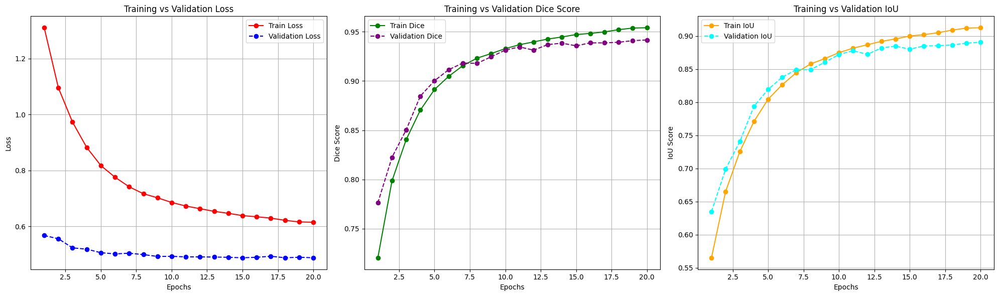

In [19]:
plot_training_progress(Unet_training_val_summary)

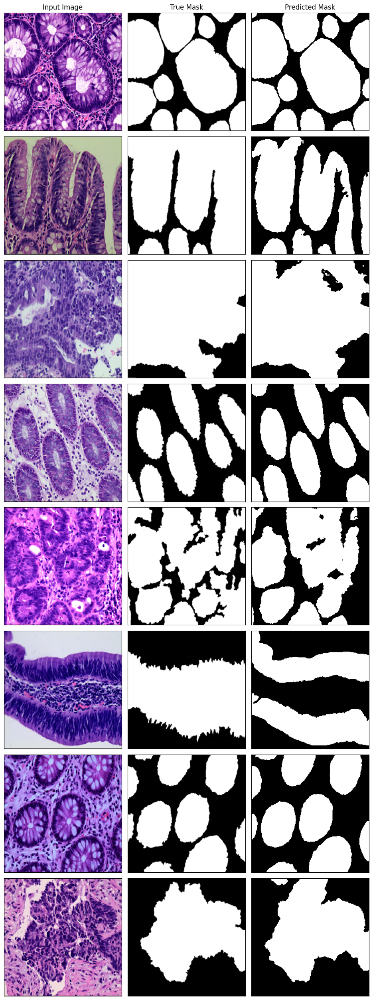

In [20]:
batch = next(iter(ebhi_val_dataloader))
predictions = torch.sigmoid(model(batch[0].to(device)))
show_inference(batch, predictions)

##Nested Unet

In [21]:
class VGGBlock(nn.Module):
    def __init__(self, in_channels, middle_channels, out_channels):
        super().__init__()
        self.relu = nn.ReLU(inplace=True)
        self.conv1 = nn.Conv2d(in_channels, middle_channels, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(middle_channels)
        self.conv2 = nn.Conv2d(middle_channels, out_channels, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        return out

In [22]:
class NestedUNet(nn.Module):
    def __init__(self, num_classes, input_channels=3, deep_supervision=False, **kwargs):
        super().__init__()

        nb_filter = [16, 32, 64, 128, 256]

        self.deep_supervision = deep_supervision

        self.pool = nn.MaxPool2d(2, 2)
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv0_0 = VGGBlock(input_channels, nb_filter[0], nb_filter[0])
        self.conv1_0 = VGGBlock(nb_filter[0], nb_filter[1], nb_filter[1])
        self.conv2_0 = VGGBlock(nb_filter[1], nb_filter[2], nb_filter[2])
        self.conv3_0 = VGGBlock(nb_filter[2], nb_filter[3], nb_filter[3])
        self.conv4_0 = VGGBlock(nb_filter[3], nb_filter[4], nb_filter[4])

        self.conv0_1 = VGGBlock(nb_filter[0]+nb_filter[1], nb_filter[0], nb_filter[0])
        self.conv1_1 = VGGBlock(nb_filter[1]+nb_filter[2], nb_filter[1], nb_filter[1])
        self.conv2_1 = VGGBlock(nb_filter[2]+nb_filter[3], nb_filter[2], nb_filter[2])
        self.conv3_1 = VGGBlock(nb_filter[3]+nb_filter[4], nb_filter[3], nb_filter[3])

        self.conv0_2 = VGGBlock(nb_filter[0]*2+nb_filter[1], nb_filter[0], nb_filter[0])
        self.conv1_2 = VGGBlock(nb_filter[1]*2+nb_filter[2], nb_filter[1], nb_filter[1])
        self.conv2_2 = VGGBlock(nb_filter[2]*2+nb_filter[3], nb_filter[2], nb_filter[2])

        self.conv0_3 = VGGBlock(nb_filter[0]*3+nb_filter[1], nb_filter[0], nb_filter[0])
        self.conv1_3 = VGGBlock(nb_filter[1]*3+nb_filter[2], nb_filter[1], nb_filter[1])

        self.conv0_4 = VGGBlock(nb_filter[0]*4+nb_filter[1], nb_filter[0], nb_filter[0])

        if self.deep_supervision:
            self.final1 = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)
            self.final2 = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)
            self.final3 = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)
            self.final4 = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)
        else:
            self.final = nn.Conv2d(nb_filter[0], 1, kernel_size=1)


    def forward(self, input):
        x0_0 = self.conv0_0(input)
        x1_0 = self.conv1_0(self.pool(x0_0))
        x0_1 = self.conv0_1(torch.cat([x0_0, self.up(x1_0)], 1))

        x2_0 = self.conv2_0(self.pool(x1_0))
        x1_1 = self.conv1_1(torch.cat([x1_0, self.up(x2_0)], 1))
        x0_2 = self.conv0_2(torch.cat([x0_0, x0_1, self.up(x1_1)], 1))

        x3_0 = self.conv3_0(self.pool(x2_0))
        x2_1 = self.conv2_1(torch.cat([x2_0, self.up(x3_0)], 1))
        x1_2 = self.conv1_2(torch.cat([x1_0, x1_1, self.up(x2_1)], 1))
        x0_3 = self.conv0_3(torch.cat([x0_0, x0_1, x0_2, self.up(x1_2)], 1))

        x4_0 = self.conv4_0(self.pool(x3_0))
        x3_1 = self.conv3_1(torch.cat([x3_0, self.up(x4_0)], 1))
        x2_2 = self.conv2_2(torch.cat([x2_0, x2_1, self.up(x3_1)], 1))
        x1_3 = self.conv1_3(torch.cat([x1_0, x1_1, x1_2, self.up(x2_2)], 1))
        x0_4 = self.conv0_4(torch.cat([x0_0, x0_1, x0_2, x0_3, self.up(x1_3)], 1))

        if self.deep_supervision:
            output1 = self.final1(x0_1)
            output2 = self.final2(x0_2)
            output3 = self.final3(x0_3)
            output4 = self.final4(x0_4)
            return [output1, output2, output3, output4]

        else:
            output = self.final(x0_4)
            return output

In [23]:
summary(NestedUNet(number_of_classes), input_data=eval_batch_data[0])

Layer (type:depth-idx)                   Output Shape              Param #
NestedUNet                               [8, 1, 224, 224]          --
├─VGGBlock: 1-1                          [8, 16, 224, 224]         --
│    └─Conv2d: 2-1                       [8, 16, 224, 224]         448
│    └─BatchNorm2d: 2-2                  [8, 16, 224, 224]         32
│    └─ReLU: 2-3                         [8, 16, 224, 224]         --
│    └─Conv2d: 2-4                       [8, 16, 224, 224]         2,320
│    └─BatchNorm2d: 2-5                  [8, 16, 224, 224]         32
│    └─ReLU: 2-6                         [8, 16, 224, 224]         --
├─MaxPool2d: 1-2                         [8, 16, 112, 112]         --
├─VGGBlock: 1-3                          [8, 32, 112, 112]         --
│    └─Conv2d: 2-7                       [8, 32, 112, 112]         4,640
│    └─BatchNorm2d: 2-8                  [8, 32, 112, 112]         64
│    └─ReLU: 2-9                         [8, 32, 112, 112]         --
│    └─C

In [24]:
model_nested = NestedUNet(number_of_classes)
model_nested = model_nested.to(device)
nested_Unet_training_val_summary = train_model(model_nested, device, ebhi_train_dataloader, ebhi_val_dataloader,
                                        lr=2e-4, epochs=cfg.SINGLE_NETWORK_TRAINING_EPOCHS,with_dice=True, with_iou=True)


Epoch 1/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 1/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 2/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 2/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 3/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 3/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 4/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 4/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 5/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 5/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 6/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 6/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 7/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 7/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 8/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 8/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 9/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 9/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 10/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 10/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 11/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 11/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 12/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 12/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 13/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 13/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 14/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 14/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 15/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 15/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 16/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 16/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 17/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 17/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 18/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 18/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 19/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 19/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 20/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 20/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

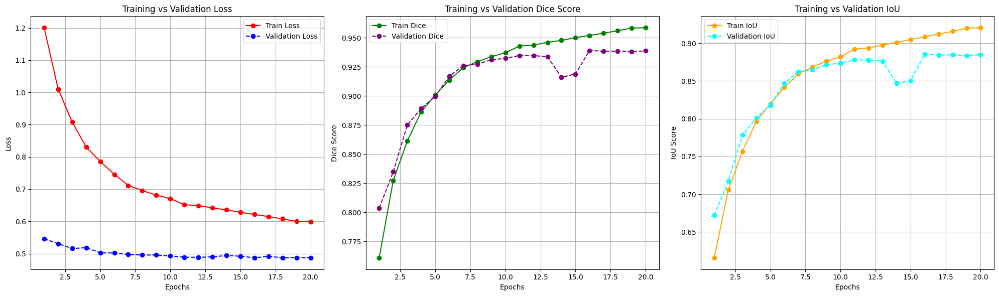

In [25]:
plot_training_progress(nested_Unet_training_val_summary)

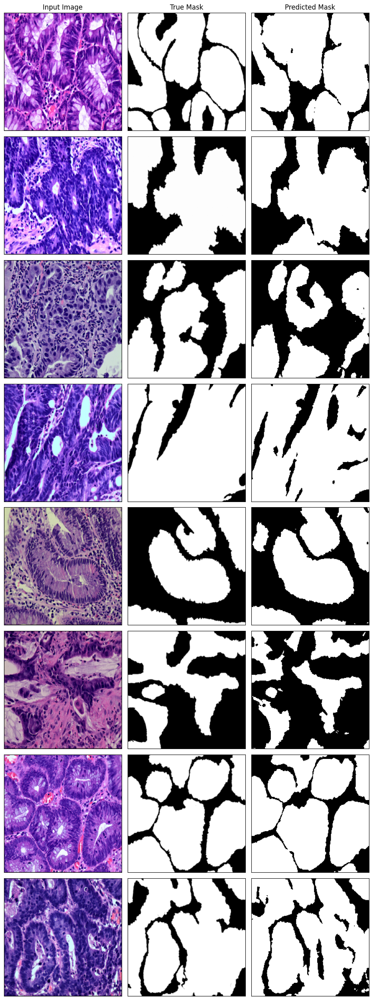

In [26]:
batch = next(iter(ebhi_val_dataloader))
predictions = torch.sigmoid(model_nested(batch[0].to(device)))
show_inference(batch, predictions)

##Attention Unet

In [27]:
class ConvBlockAttention(nn.Module):
    """Simplified convolution block with a single Conv layer, BatchNorm, and ReLU."""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        return self.relu(self.bn(self.conv(x)))

class DownScale(nn.Module):
    """Downscaling with maxpool then ConvBlock, transforming an input with (h, w, in_channels) to (h/2, w/2, out_channels)"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.block = ConvBlockAttention(in_channels, out_channels)

    def forward(self, x):
        x = self.pool(x)
        x = self.block(x)
        return x

class AttentionBlock(nn.Module):
    """Simplified Attention Gate."""
    def __init__(self, f_g, f_l, out_channels):
        super(AttentionBlock, self).__init__()
        self.conv_g = nn.Conv2d(f_g, out_channels, kernel_size=1, stride=1, padding=0)
        self.conv_x = nn.Conv2d(f_l, out_channels, kernel_size=1, stride=1, padding=0)
        self.psi = nn.Conv2d(out_channels, 1, kernel_size=1, stride=1, padding=0)
        self.sigmoid = nn.Sigmoid()

    def forward(self, g, x):
        psi = self.sigmoid(self.psi(F.relu(self.conv_g(g) + self.conv_x(x))))
        return x * psi

class UpScale(nn.Module):
    """Upscaling with a single ConvBlock and an optional Attention Gate."""
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)

        self.conv = ConvBlockAttention(in_channels, out_channels)
        self.attention = AttentionBlock(f_g=in_channels // 2, f_l=out_channels, out_channels=out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size(2) - x1.size(2)
        diffX = x2.size(3) - x1.size(3)
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2])
        x2 = self.attention(x1, x2)
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class AttentionUnetLite(nn.Module):
    """Lightweight Attention U-Net with reduced depth and complexity."""
    def __init__(self, n_channels, n_classes, start=32, bilinear=False):
        super(AttentionUnetLite, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = ConvBlockAttention(n_channels, start)
        self.down1 = DownScale(start, 2*start)
        self.down2 = DownScale(2*start, 4*start)

        factor = 2 if bilinear else 1
        self.down3 = DownScale(4*start, 8*start // factor)

        self.up1 = UpScale(8*start, 4*start // factor, bilinear)
        self.up2 = UpScale(4*start, 2*start, bilinear)
        self.up3 = UpScale(2*start, start, bilinear)
        self.outc = nn.Conv2d(start, 1, kernel_size=1)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)

        x = self.up1(x4, x3)
        x = self.up2(x, x2)
        x = self.up3(x, x1)
        logits = self.outc(x)
        return logits


In [28]:
summary(AttentionUnetLite(3, number_of_classes), input_data=eval_batch_data[0])

Layer (type:depth-idx)                   Output Shape              Param #
AttentionUnetLite                        [8, 1, 224, 224]          --
├─ConvBlockAttention: 1-1                [8, 32, 224, 224]         --
│    └─Conv2d: 2-1                       [8, 32, 224, 224]         864
│    └─BatchNorm2d: 2-2                  [8, 32, 224, 224]         64
│    └─ReLU: 2-3                         [8, 32, 224, 224]         --
├─DownScale: 1-2                         [8, 64, 112, 112]         --
│    └─MaxPool2d: 2-4                    [8, 32, 112, 112]         --
│    └─ConvBlockAttention: 2-5           [8, 64, 112, 112]         --
│    │    └─Conv2d: 3-1                  [8, 64, 112, 112]         18,432
│    │    └─BatchNorm2d: 3-2             [8, 64, 112, 112]         128
│    │    └─ReLU: 3-3                    [8, 64, 112, 112]         --
├─DownScale: 1-3                         [8, 128, 56, 56]          --
│    └─MaxPool2d: 2-6                    [8, 64, 56, 56]           --
│    └─Co

In [29]:
model = AttentionUnetLite(3, number_of_classes)
model = model.to(device)
AttentionUnet_training_val_summary = train_model(model, device, ebhi_train_dataloader, ebhi_val_dataloader,
                                        lr=2e-4, epochs=cfg.SINGLE_NETWORK_TRAINING_EPOCHS,with_dice=True, with_iou=True)

Epoch 1/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 1/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 2/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 2/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 3/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 3/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 4/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 4/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 5/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 5/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 6/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 6/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 7/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 7/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 8/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 8/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 9/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 9/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 10/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 10/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 11/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 11/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 12/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 12/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 13/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 13/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 14/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 14/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 15/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 15/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 16/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 16/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 17/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 17/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 18/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 18/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 19/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 19/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

Epoch 20/20 - Training Loss: 0:   0%|          | 0/192 [00:00<?, ?it/s]

Epoch 20/20 - Validation Loss: 0:   0%|          | 0/83 [00:00<?, ?it/s]

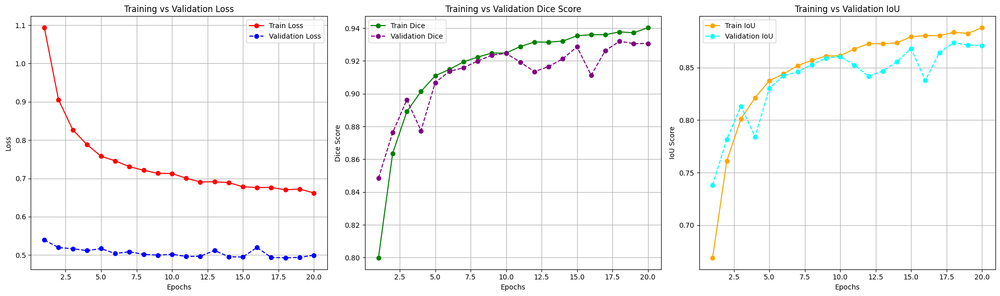

In [30]:
plot_training_progress(AttentionUnet_training_val_summary)

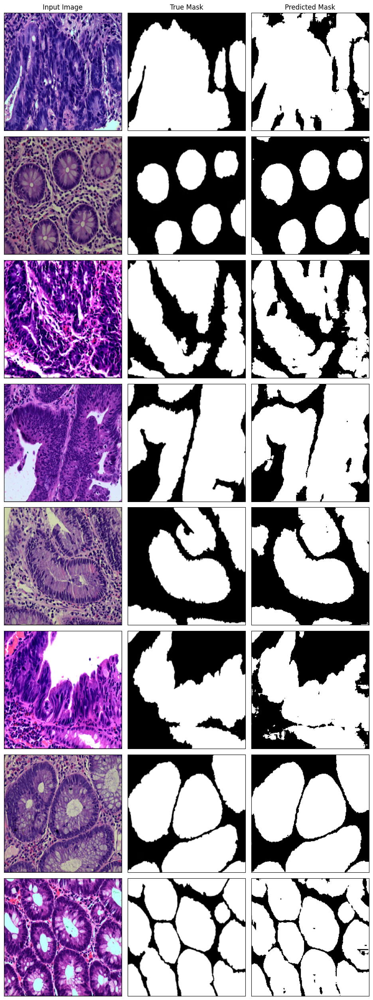

In [31]:
batch = next(iter(ebhi_val_dataloader))
predictions = torch.sigmoid(model(batch[0].to(device)))
show_inference(batch, predictions)